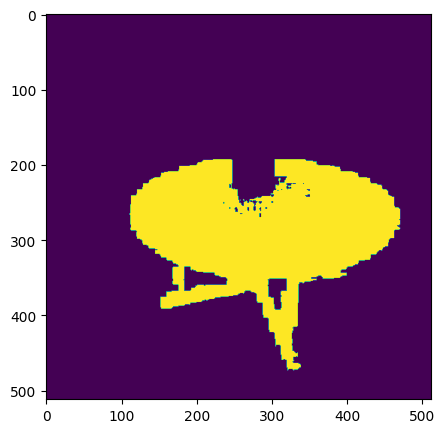

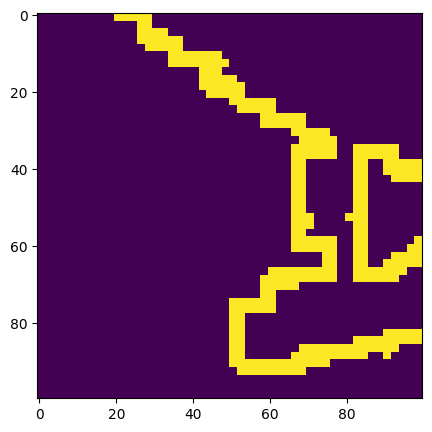

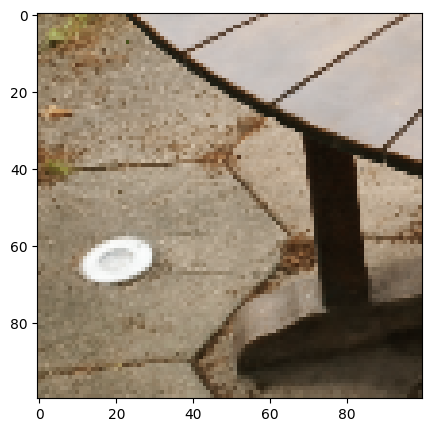

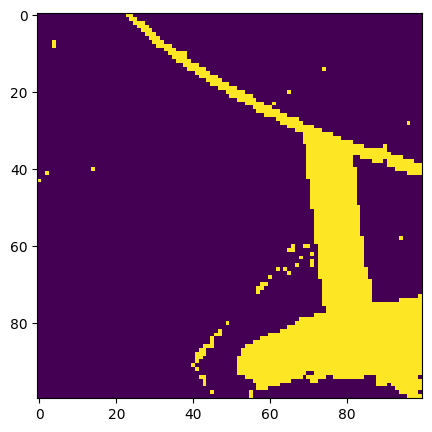

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt 
import torch.nn.functional as F
import torch
# mask = np.load('/ssddata/yliugu/Segment-Anything-NeRF/trial3_teatime/validation/ngp_ep0003_frame_00001_mask.npy')
# mask = np.load('/ssddata/yliugu/teatime/masks/frame_00001_masks.npy')
mask_1 = np.load('/ssddata/yliugu/data/Datasets/garden/table_sumafter/DSC08046_masks.npy')
plt.figure(figsize=(5,5))
plt.imshow(mask_1)

def get_incoherent_mask(input_masks, sfact=2, keep_size=True):
    mask = input_masks.float()
    w = input_masks.shape[-1]
    h = input_masks.shape[-2]
    mask_small = F.interpolate(mask, (h//sfact, w//sfact), mode='bilinear')
    mask_recover = F.interpolate(mask_small, (h, w), mode='bilinear')
    mask_residue = (mask - mask_recover).abs()
    mask_uncertain = F.interpolate(
        mask_residue, (h//sfact, w//sfact), mode='bilinear')
    mask_uncertain[mask_uncertain >= 0.01] = 1.
    
    if keep_size:
        mask_uncertain = F.interpolate(
            mask_uncertain, (h,w), mode='nearest')

    return mask_uncertain

inco = get_incoherent_mask(torch.tensor(mask_1)[..., 0][None, None, ...])

plt.figure(figsize=(5,5))
plt.imshow(inco.numpy()[0,0][300:400, 100:200])

img = cv2.imread('/ssddata/yliugu/Segment-Anything-NeRF/trial_model/trial_garden_sam/validation/ngp_ep0029_DSC08046_rgb.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img[300:400, 100:200]

plt.figure(figsize=(5,5))
plt.imshow(img)
img = torch.tensor(img) / 255.

rgb_sample = img[80,75]
rgb = img.reshape([-1,3])

color_similarity_map = torch.norm(rgb-rgb_sample, dim=-1)
similarity_map = color_similarity_map < 0.2

similarity_map = similarity_map.reshape([100,100])

plt.figure(figsize=(5,5))
plt.imshow(similarity_map.numpy())


/tmp/ipykernel_2480692/4263594567.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5,5))


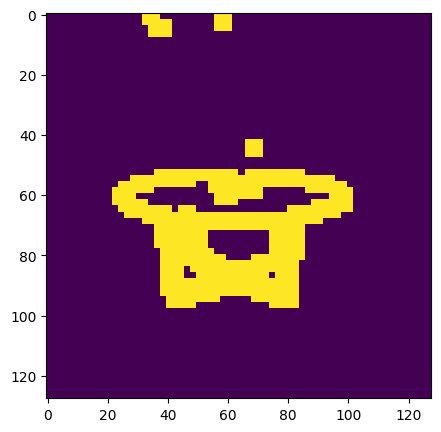

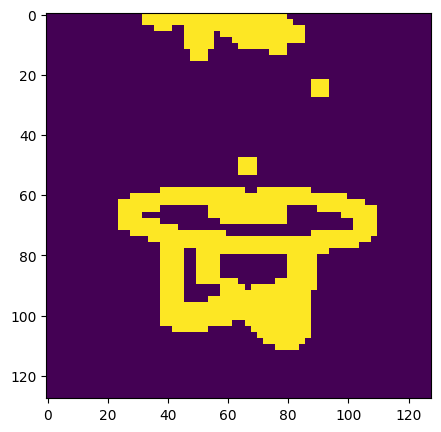

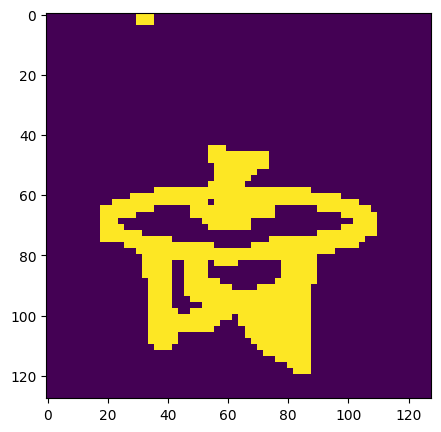

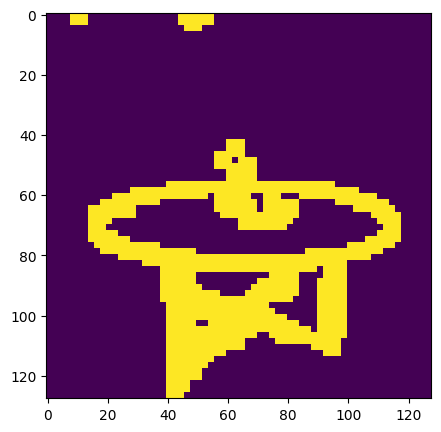

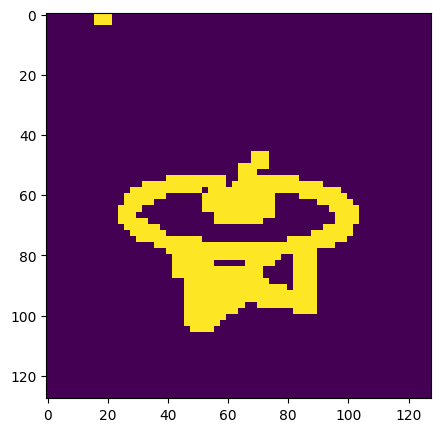

...

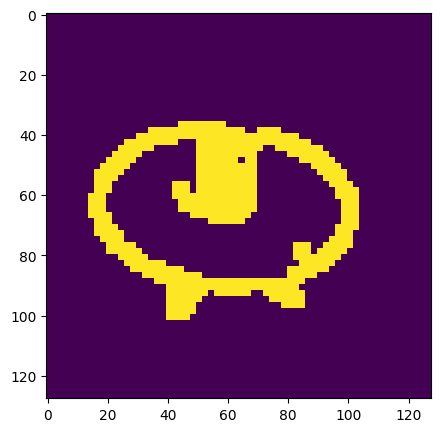

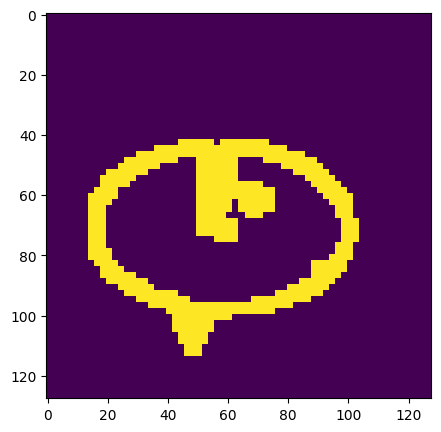

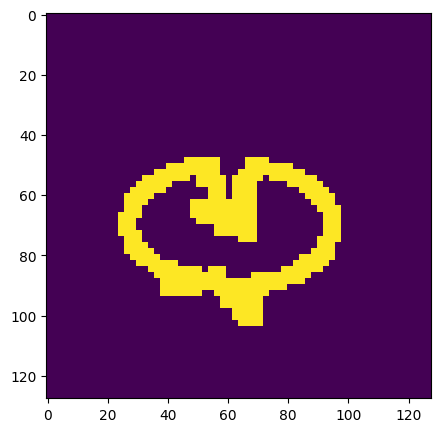

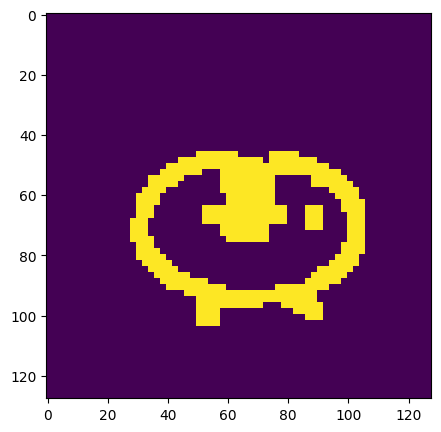

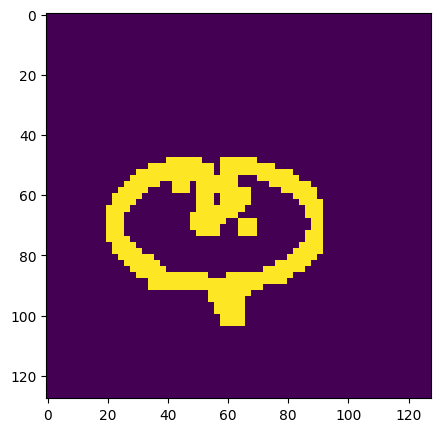

In [15]:
import numpy as np
mask_files = '/ssddata/yliugu/Segment-Anything-NeRF/debug/files.npy'
masks = np.load(mask_files)


for i in range(masks.shape[0]):
    plt.figure(figsize=(5,5))
    plt.imshow(masks[i])
    
# plt.figure(figsize=(5,5))
# plt.imshow(masks)

(21, 262144)


/tmp/ipykernel_2480692/1669329381.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5,5))


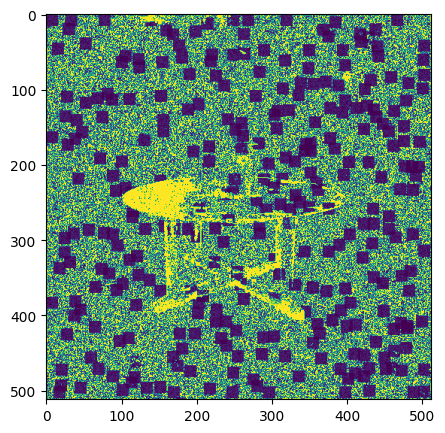

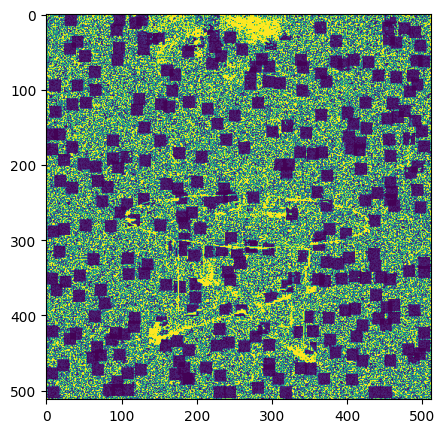

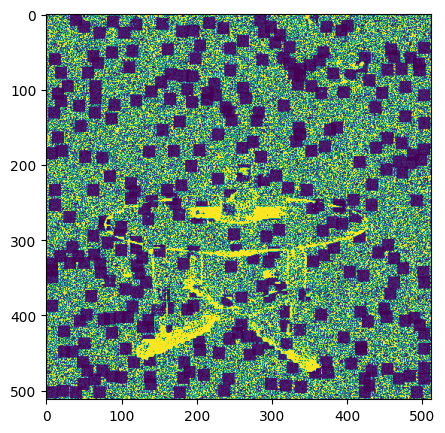

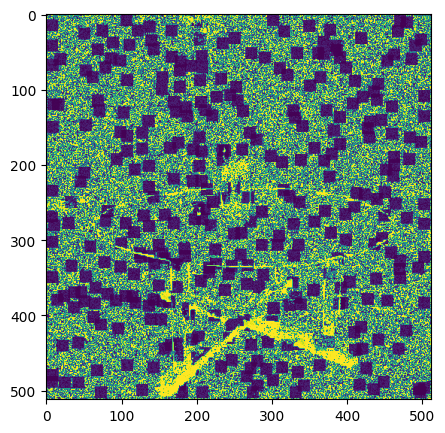

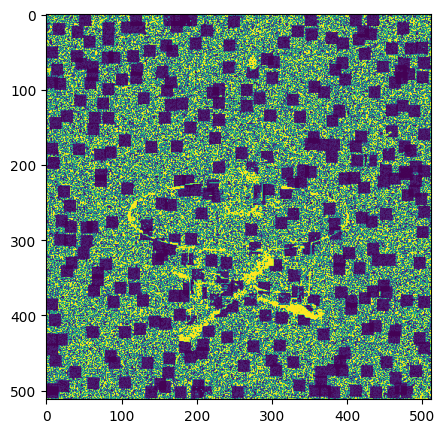

...

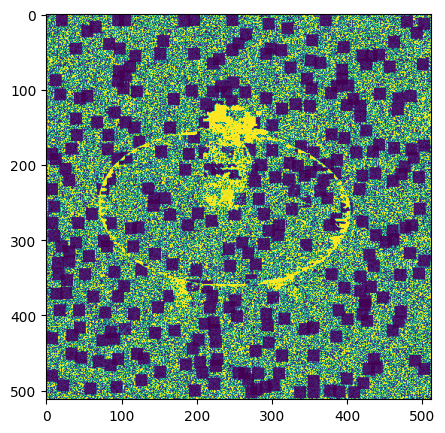

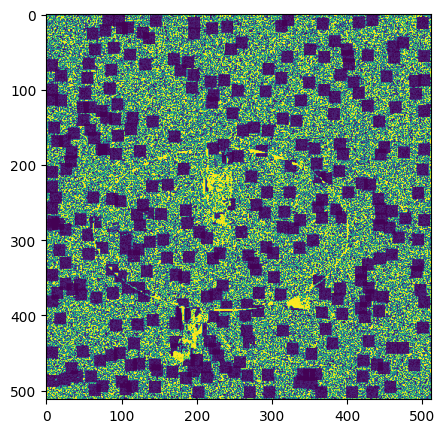

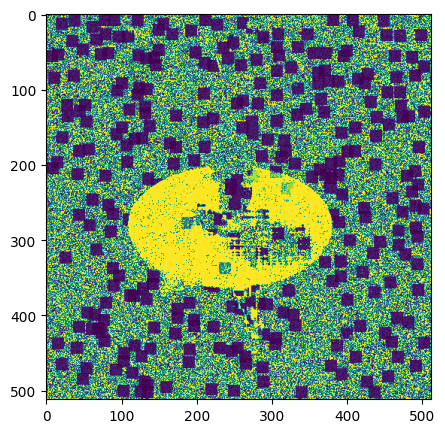

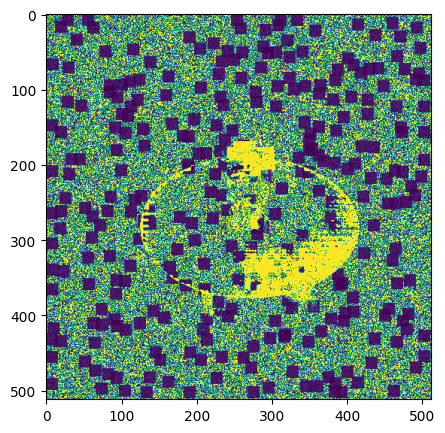

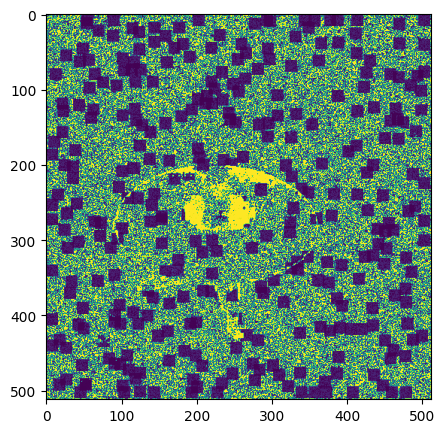

In [11]:
import numpy as np
mask_files = '/ssddata/yliugu/Segment-Anything-NeRF/debug/error_47.npy'
masks = np.load(mask_files)
print(masks.shape)
for i in range(masks.shape[0]):
    plt.figure(figsize=(5,5))
    plt.imshow(masks[i].reshape([512,512]))

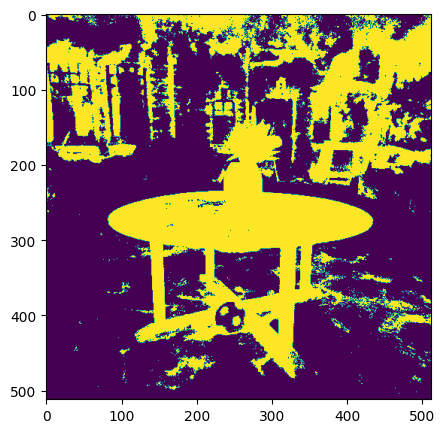

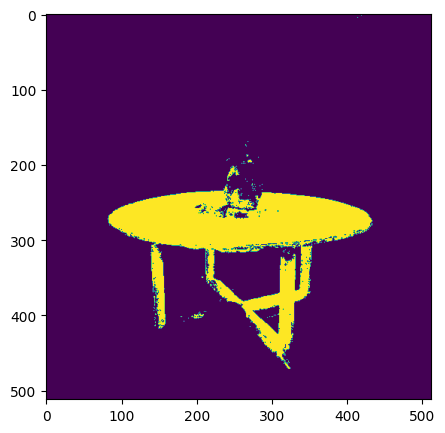

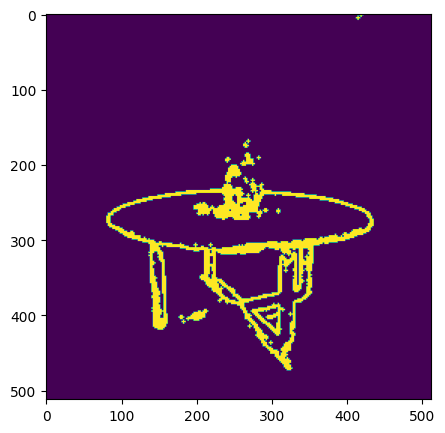

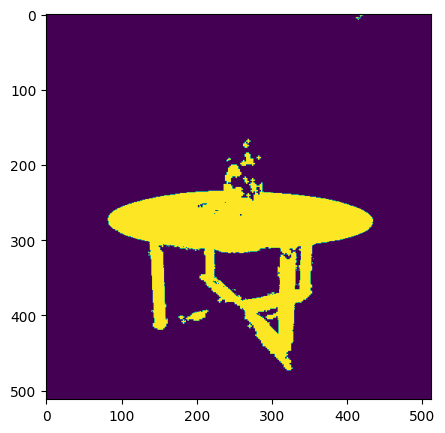

In [34]:
mask_local_file = '/ssddata/yliugu/Segment-Anything-NeRF/trial_model/garden_mask_adaptive_density_with_rgb_loss/validation/ngp_ep0003_DSC07973_mask.npy'
mask_global_file = '/ssddata/yliugu/Segment-Anything-NeRF/trial_model/garden_mask_adaptive_density_without_rgb_loss/validation/ngp_ep0001_DSC07973_mask.npy'


mask_local = np.load(mask_local_file)
pred_label = np.argmax(mask_local, axis=-1)

plt.figure(figsize=(5,5))
plt.imshow(mask_local[..., 1] > 0.5)


mask_global = np.load(mask_global_file)
pred_label = np.argmax(mask_global, axis=-1)

plt.figure(figsize=(5,5))
plt.imshow(mask_global[..., 1] > 0.5)
global_final = mask_global[..., 1] > 0.5


inco = get_incoherent_mask(torch.tensor(mask_global[..., 1] > 0.5 )[None, None, ...])
plt.figure(figsize=(5,5))
plt.imshow(inco.numpy()[0,0])

inco = inco.numpy()[0,0]


global_final = (mask_global[..., 1]) * (1. - inco) + inco * (mask_local[..., 1])
plt.figure(figsize=(5,5))
plt.imshow(global_final > 0.5)

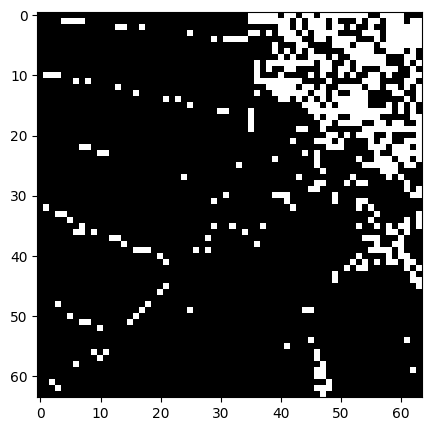

In [3]:



img = cv2.imread('/ssddata/yliugu/Segment-Anything-NeRF/debug/201_similarity.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(5,5))
plt.imshow(img)